<a href="https://colab.research.google.com/github/Murcha1990/ML_Course_PT/blob/main/Lecture3_Data%26Trees/PT_features.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Работа с данными

## Быстрый взгляд на данные: дашборд

In [1]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q

     \ 17.9 MB 19.4 MB/s 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 33.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 27.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.6 MB/s eta 0:00:00


In [4]:
from ydata_profiling import ProfileReport
import pandas as pd

In [5]:
data = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/ML_AI24/refs/heads/main/Lesson14_Features/Pokemon.csv')

profile_report = ProfileReport(data, title='Pandas Profiling Report')

In [6]:
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 26.96it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Тема семинара: отбор признаков

- Фильтрационные методы
- Оберточные методы
- Встроенные методы
- Метод главных компонент или PCA

In [7]:
profile_report.to_file('Pokemon_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Работа с признаками

In [8]:
data.sample(5)

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
530,478,Froslass,Ice,Ghost,480,70,80,70,80,70,110,4,False
406,371,Bagon,Dragon,NaN,300,45,75,60,40,30,50,3,False
232,214,HeracrossMega Heracross,Bug,Fighting,600,80,185,115,40,105,75,2,False
286,263,Zigzagoon,Normal,NaN,240,38,30,41,30,41,60,3,False
208,193,Yanma,Bug,Flying,390,65,65,45,75,45,95,2,False


Columns description (it's crucial!)


- #: ID for each pokemon
- Name: Name of each pokemon
- Type 1: Each pokemon has a type, this determines weakness/resistance to attacks
- Type 2: Some pokemon are dual type and have 2
- Total: sum of all stats that come after this, a general guide to how strong a pokemon is
- HP: hit points, or health, defines how much damage a pokemon can withstand before fainting
- Attack: the base modifier for normal attacks (eg. Scratch, Punch)
- Defense: the base damage resistance against normal attacks
- SP Atk: special attack, the base modifier for special attacks (e.g. fire blast, bubble beam)
- SP Def: the base damage resistance against special attacks
- Speed: determines which pokemon attacks first each round

In [9]:
# fillna and drop useless cols

display(data.isnull().sum())
data['Type 2'] = data['Type 2'].fillna('No 2nd type')

data.drop(columns=['#', 'Name'], inplace=True)

,0
#,0
Name,0
Type 1,0
Type 2,386
Total,0
HP,0
Attack,0
Defense,0
Sp. Atk,0
Sp. Def,0


In [10]:
X = data.drop(columns='Legendary')
y = data['Legendary'].astype('int')

In [11]:
y.value_counts(normalize=True)

,proportion
Legendary,
0,0.91875
1,0.08125


# Make some default pipeline

In [12]:
!pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.9/85.9 kB 2.1 MB/s eta 0:00:00


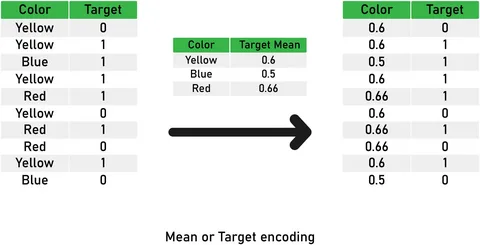

In [14]:
from sklearn.feature_selection import SelectKBest, SelectPercentile
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from category_encoders.leave_one_out import LeaveOneOutEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate
import sklearn

In [15]:
# define cat_cols

cat_cols = ['Type 1', 'Type 2']

default_pipeline = Pipeline([
    ('cat_encoder_', LeaveOneOutEncoder(cols=cat_cols)),
    ('scaler_', StandardScaler()),
    ('model_', LogisticRegression())]
)

In [16]:
from sklearn.model_selection import cross_val_score, cross_validate

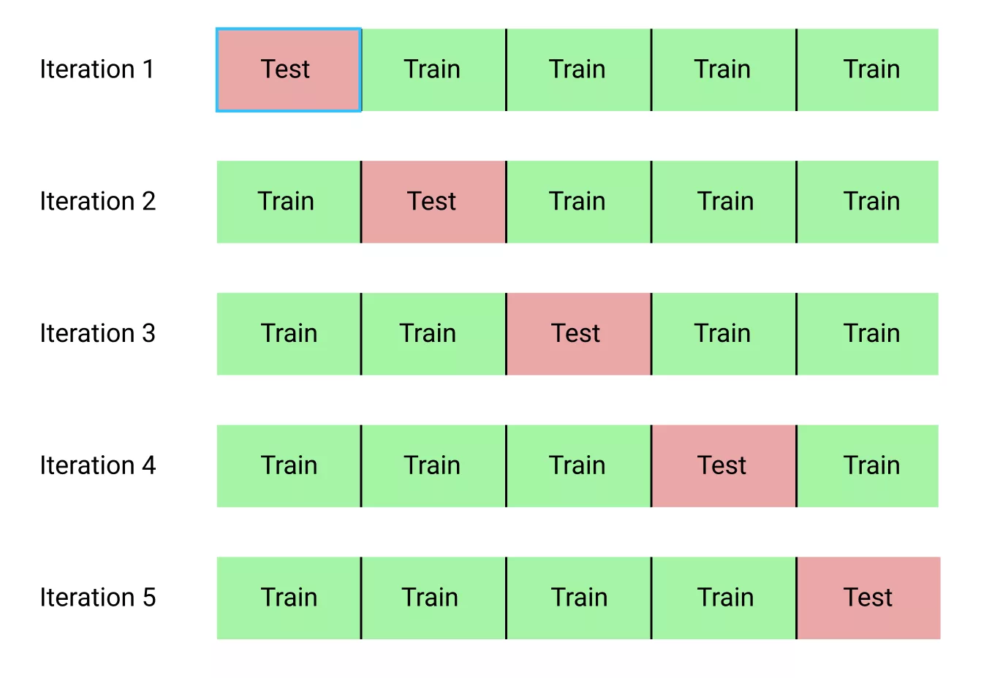

In [17]:
cv_res1 = cross_validate(default_pipeline,
                        X,
                        y,
                        cv=5,
                        scoring='f1',
                        n_jobs=-1,
                        return_train_score=True
                       )

In [18]:
cv_res1['test_score'].mean()

np.float64(0.5903571428571428)

# Make pipeline more complicated

In [19]:
# difficult pipeline

pipe_dif = Pipeline([
    ('cat_encoder_', LeaveOneOutEncoder(cols=cat_cols)),
    ('poly_featurizer_', PolynomialFeatures(degree=4)),
    ('scaler_', StandardScaler()),
    ('model_', LogisticRegression())]
)

In [20]:
cv_res2 = cross_validate(pipe_dif,
                        X,
                        y,
                        cv=5,
                        scoring='f1',
                        n_jobs=-1,
                        return_train_score=True
                       )

cv_res2

{'fit_time': array([0.22493815, 0.34205461, 0.34224534, 0.28470659, 0.1599524 ]),
 'score_time': array([0.0620954 , 0.08125806, 0.03047347, 0.0188942 , 0.01218367]),
 'test_score': array([0.47058824, 0.81481481, 0.57142857, 0.54545455, 0.64705882]),
 'train_score': array([0.94117647, 0.88421053, 0.97142857, 0.99029126, 0.94      ])}

In [21]:
cv_res2['train_score'].mean()

np.float64(0.9454213660937036)

In [22]:
cv_res2['test_score'].mean()

np.float64(0.6098689981042922)

train_score - просто класс ! модель получилась сложная, только очевидно переобученная ...

согласны, узнали ?


# Introduce feature selectors

In [23]:
data_tr = pipe_dif[:-1]

In [24]:
data_tr

Pipeline(steps=[('cat_encoder_', LeaveOneOutEncoder(cols=['Type 1', 'Type 2'])),
                ('poly_featurizer_', PolynomialFeatures(degree=4)),
                ('scaler_', StandardScaler())])

In [25]:
X_tr = data_tr.fit_transform(X, y)
print(f'data shape after transformation is {X_tr.shape}')

data shape after transformation is (800, 1001)


1k признаков - многовато, добавим в пайплайн селектор

## Фильтрационные методы

Суть таких методов в том, чтобы для каждого признака посчитать некоторую метрику "связи" с целевым признаком. И в результате оставить топ-K признаков согласно выбранной метрике.

Самые популярные такие метрики:
 - статистика хи-квадрат
 - метрика mutual information

In [26]:
from sklearn.feature_selection import f_classif, chi2, mutual_info_classif

In [27]:
# k_best = 30

pipe = Pipeline([
    ('cat_encoder_', LeaveOneOutEncoder(cols=cat_cols)),
    ('poly_featurizer_', PolynomialFeatures(degree=4)),
    ('scaler_', StandardScaler()),
    ('selector_', SelectKBest(score_func=mutual_info_classif, k=100)),
    ('model_', LogisticRegression())]
)

In [28]:
cv_res = cross_validate(pipe, X, y, cv=5, scoring='f1', return_train_score=True)
cv_res

{'fit_time': array([5.13660359, 4.11278653, 4.05549502, 4.91777229, 4.63669562]),
 'score_time': array([0.01581192, 0.01530194, 0.01696134, 0.01554656, 0.01543832]),
 'test_score': array([0.375     , 0.57142857, 0.58333333, 0.54545455, 0.58064516]),
 'train_score': array([0.77669903, 0.69662921, 0.75510204, 0.80412371, 0.82105263])}

In [29]:
# k best нужно подбирать

cv_res['test_score'].mean()

np.float64(0.5311723223013545)

In [30]:
cv_res['train_score'].mean()

np.float64(0.7707213252689679)

## Жадный метод отбора

In [31]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [32]:
k_best = 50

rfe = RFE(LogisticRegression(max_iter=1000), n_features_to_select=k_best, step=30)

In [33]:
X_tr.shape

(800, 1001)

In [35]:
res = rfe.fit_transform(X_tr, y)
display(res.shape)
res

(800, 50)

array([[-0.98555744, -0.44705251, -0.94218651, ..., -0.40535388,
        -0.52135831, -0.72668962],
       [-0.48479877, -0.37458929, -0.94218651, ..., -0.16466941,
        -0.18003271, -0.70651232],
       [ 0.42451538, -0.24576578, -0.94218651, ...,  0.45023305,
         0.73602435, -0.6731154 ],
       ...,
       [-0.16049792,  0.66347512, -0.94218651, ...,  3.97831918,
         2.1076934 ,  4.87819432],
       [-0.16049792,  1.03195307, -0.94218651, ...,  6.06069716,
         2.51608978,  4.87819432],
       [ 1.36562373, -0.13354138, -0.94218651, ...,  1.4680924 ,
         0.19750623,  1.93926564]])

In [36]:
pipe_rfe = Pipeline([
    ('cat_encoder_', LeaveOneOutEncoder(cols=cat_cols)),
    ('poly_featurizer_', PolynomialFeatures(degree=4)),
    ('scaler_', StandardScaler()),
    ('selector_', RFE(LogisticRegression(max_iter=1000),
                      n_features_to_select=20,
                      step=30
                     )),
    ('model_', LogisticRegression())]
)

In [37]:
cv_res3 = cross_validate(pipe_rfe, X, y, cv=5, scoring='f1', return_train_score=True)
cv_res3

{'fit_time': array([11.67091823, 12.49040389,  9.68522167, 12.55867362, 15.75082564]),
 'score_time': array([0.01621747, 0.015028  , 0.03537297, 0.04181957, 0.01825213]),
 'test_score': array([0.42105263, 0.75      , 0.71428571, 0.54545455, 0.66666667]),
 'train_score': array([0.7628866 , 0.7826087 , 0.86315789, 0.83673469, 0.84210526])}

In [38]:
cv_res3['test_score'].mean()

np.float64(0.6194919115971748)

In [39]:
cv_res3['train_score'].mean()

np.float64(0.8174986290725211)

## С помощью модели

In [40]:
from sklearn.feature_selection import SelectFromModel

In [41]:
sel = SelectFromModel(LogisticRegression(penalty='l1', max_iter=1000, solver='liblinear'), threshold=0.1)

In [42]:
# пример

res = sel.fit_transform(X_tr, y)
display(res.shape)
res

(800, 38)

array([[-0.7732015 , -0.80122124, -0.31795653, ..., -0.52135831,
        -0.72668962, -0.81966779],
       [-0.33767384, -0.35246512, -0.30715816, ..., -0.18003271,
        -0.70651232, -0.81698899],
       [ 0.6523422 ,  0.66762108, -0.28796106, ...,  0.73602435,
        -0.6731154 , -0.81341726],
       ...,
       [ 0.80566326,  0.55477968,  0.91906366, ...,  2.1076934 ,
         4.87819432,  4.18343684],
       [ 1.06849938,  0.55477968,  0.91906366, ...,  2.51608978,
         4.87819432,  4.18343684],
       [ 2.2512619 ,  1.23182804, -0.18905176, ...,  0.19750623,
         1.93926564,  2.6404483 ]])

In [43]:
pipe_lasso =  Pipeline([
    ('cat_encoder_', LeaveOneOutEncoder(cols=cat_cols)),
    ('poly_featurizer_', PolynomialFeatures(degree=4)),
    ('scaler_', StandardScaler()),
    ('selector_', SelectFromModel(LogisticRegression(penalty='l1', solver='liblinear'),
                                  threshold=1e-5)),
    ('model_', LogisticRegression())]
)

In [44]:
cv_res4 = cross_validate(pipe_lasso, X, y, cv=5, scoring='f1', return_train_score=True)
cv_res4

{'fit_time': array([0.16477561, 0.19993734, 0.15896297, 0.14758301, 0.16352868]),
 'score_time': array([0.01596403, 0.0153656 , 0.01518965, 0.0149858 , 0.01651645]),
 'test_score': array([0.47058824, 0.83333333, 0.64285714, 0.54545455, 0.66666667]),
 'train_score': array([0.89320388, 0.86597938, 0.93203883, 0.90909091, 0.90909091])}

In [45]:
cv_res4['test_score'].mean()

np.float64(0.6317799847211611)